<a href="https://colab.research.google.com/github/micheldc55/Deep-Learning/blob/main/dcgan_anime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<font color="#CA0032"><h1 align="left">**Redes Generativas Adversariales (GANs)**</h1></font>

<font color="#6E6E6E"><h1 align="left">**Personajes de Anime: Modelos Deep Learning**</h1></font>


In [ ]:
COLAB    = True
GRAPHVIZ = True

In [ ]:
# Extendido de:
# https://github.com/naokishibuya/deep-learning/blob/master/python/dcgan_celeba.ipynb

In [ ]:
if COLAB:
    %tensorflow_version 1.x
    !pip install h5py==2.10.0

import numpy as np
from glob import glob
from tqdm import tqdm
from keras.initializers import RandomNormal
from keras.layers import Dense, Activation, LeakyReLU, BatchNormalization
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.models import Sequential
from keras.optimizers import Adam, SGD
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

TensorFlow 1.x selected.
     |████████████████████████████████| 2.9 MB 19.9 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0


Using TensorFlow backend.


## **Loading Dataset**

In [ ]:
if COLAB:
    from google_drive_downloader import GoogleDriveDownloader as gdd
    gdd.download_file_from_google_drive(file_id='1brlEoNd_iFQLM21E-ld7z430EkAoCNN-',
                                        dest_path='./ANIME_PLANET_FACES_COLOUR_ONLY_64.zip',
                                        overwrite=True, unzip=True)

Unzipping...Done.


Now we load all the filenames:

In [ ]:
filenames = np.array(glob('./ANIME_PLANET_FACES_COLOUR_ONLY_64/*.png'))
X_orig = []
for f in tqdm(filenames):
    X_orig.append(plt.imread(f))
X_orig = np.array(X_orig)

100%|██████████| 4231/4231 [00:01<00:00, 2884.93it/s]


Let's examine some sample images.

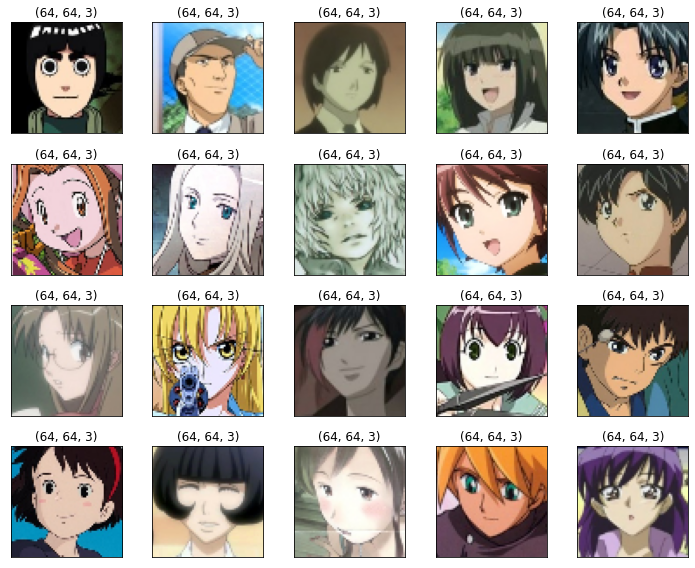

In [ ]:
plt.figure(figsize=(10, 8))
for i in range(20):
    img = X_orig[i]
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(img.shape)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

In [ ]:
X_train_orig, X_test_orig = train_test_split(X_orig, test_size=.3)

In [ ]:
print(X_train_orig.shape)
print(X_test_orig.shape)

(2961, 64, 64, 3)
(1270, 64, 64, 3)


## **Preprocessing and Deprocessing**

Those images are pretty big. We will crop and resize them.

In [ ]:
def crop_image(img, size=(32, 32)):
    # crop
    rows, cols = img.shape[:2]
    crop_r, crop_c = 25, 50
    start_row, start_col = (rows - crop_r) // 2, (cols - crop_c) // 2
    end_row, end_col = rows - start_row, cols - start_row
#    img = img[start_row:end_row, start_col:end_col, :]
    # resize
    #img = imresize(img, size)
    img = (255*img).astype(np.uint8)
    img = np.array(Image.fromarray(img).resize(size))
    return img

In [ ]:
X_train = []
for img in tqdm(X_train_orig):
    X_train.append(crop_image(img))
X_train = np.array(X_train)

100%|██████████| 2961/2961 [00:00<00:00, 8940.97it/s]


In [ ]:
X_test = []
for img in tqdm(X_test_orig):
    X_test.append(crop_image(img))
X_test = np.array(X_test)

100%|██████████| 1270/1270 [00:00<00:00, 9021.73it/s]


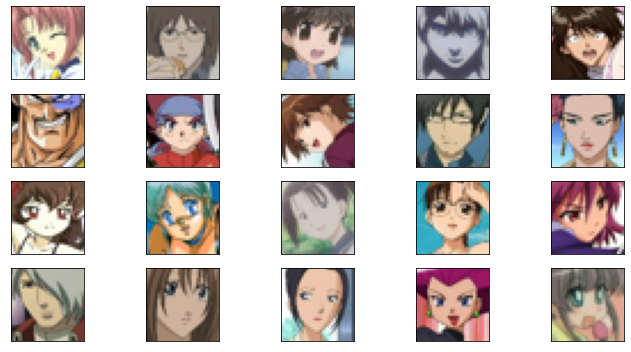

In [ ]:
plt.figure(figsize=(10, 5))
for i in range(20):
    img = X_train[i]
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

As usual, we need preprocessing and later deprocessing of the images.  

As we will see later on, the generator is using `tanh` activation, for which we need to preprocess the image data into the range between -1 and 1.

In [ ]:
X_train = X_train / 255.

In [ ]:
X_train.min(), X_train.max()

(0.0, 1.0)

In [ ]:
def preprocess(x):
    return 2*x-1

def deprocess(x):
    return np.clip((x+1)/2, 0, 1) # make sure to use uint8 type otherwise the image won't display properly

In [ ]:
X_train_norm = preprocess(X_train)
X_test_norm  = preprocess(X_test)

## **Generator**

The generator takes a latent sample and produces a color Anime face image.

In [ ]:
def make_generator(input_size, leaky_alpha, init_stddev):
    # generates images in (32,32,3)
    return Sequential([
        Dense(4*4*512, input_shape=(input_size,), 
#              kernel_initializer=RandomNormal(stddev=init_stddev)
             ),
        Reshape(target_shape=(4, 4, 512)),
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2DTranspose(256, kernel_size=5, strides=2, padding='same', 
#                        kernel_initializer=RandomNormal(stddev=init_stddev)
                       ), # 8x8
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', 
#                        kernel_initializer=RandomNormal(stddev=init_stddev)
                       ), # 16x16
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', 
#                        kernel_initializer=RandomNormal(stddev=init_stddev)
                       ), # 32x32
        Activation('tanh')
    ])

## **Discriminator**

The discriminator is a classifier to tell if the input image is real or fake.  

In [ ]:
def make_discriminator(leaky_alpha, init_stddev):
    # classifies images in (64,64,3)
    return Sequential([        
        Conv2D(64, kernel_size=5, strides=2, padding='same', 
               kernel_initializer=RandomNormal(stddev=init_stddev),    # 16x16
               input_shape=(32, 32, 3)),
        LeakyReLU(alpha=leaky_alpha),
        Conv2D(128, kernel_size=5, strides=2, padding='same', 
               kernel_initializer=RandomNormal(stddev=init_stddev)),   # 8x8
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2D(256, kernel_size=5, strides=2, padding='same', 
               kernel_initializer=RandomNormal(stddev=init_stddev)),   # 4x4
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Flatten(),
        Dense(1, kernel_initializer=RandomNormal(stddev=init_stddev)),
        Activation('sigmoid')        
    ])

## **DCGAN**

We connect the generator and the discriminator to make a DCGAN.

In [ ]:
# beta_1 is the exponential decay rate for the 1st moment estimates in Adam optimizer
def make_DCGAN(sample_size, 
               g_learning_rate, 
               g_beta_1,
               d_learning_rate,
               d_beta_1,
               leaky_alpha,
               init_std):
    # generator
    generator = make_generator(sample_size, leaky_alpha, init_std)

    # discriminator
    discriminator = make_discriminator(leaky_alpha, init_std)
    discriminator.compile(
        optimizer=Adam(lr=d_learning_rate, beta_1=d_beta_1), 
        # optimizer=SGD(lr=g_learining_rate),  ### Este optimizer es mejor que el Adam cuando quiero mejoras más lentas. Adam es muy greedy y a veces hace cambios
                                               ### demasiados bruscos y "desaprende". Si cambio esto tengo que cambiar también el learning rate.
        loss='binary_crossentropy')
    
    # GAN
    gan = Sequential([generator, discriminator])
    gan.compile(optimizer=Adam(lr=g_learning_rate, beta_1=g_beta_1), loss='binary_crossentropy')
    
    return gan, generator, discriminator

## **Training DCGAN**

The below is a list of utility functions:

In [ ]:
def make_latent_samples(n_samples, sample_size):
    #return np.random.uniform(-1, 1, size=(n_samples, sample_size))
    return np.random.normal(loc=0, scale=1, size=(n_samples, sample_size))

def make_trainable(model, trainable):
    for layer in model.layers:
        layer.trainable = trainable
        
def make_labels(size):
    return np.ones([size, 1]), np.zeros([size, 1])

def show_losses(losses):
    losses = np.array(losses)
    
    fig, ax = plt.subplots()
    plt.plot(losses.T[0], label='Discriminator')
    plt.plot(losses.T[1], label='Generator')
    plt.title("Validation Losses")
    plt.legend()
    plt.show()
    
def show_images(generated_images, cols=10):
    n_images = len(generated_images)
    rows = n_images//cols
    
    plt.figure(figsize=(10, 8))
    for i in range(n_images):
        img = deprocess(generated_images[i])
        ax = plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show()

In the training loop, we need to load a batch of face images and use them as real images.

### **Training**

I specify a smaller learning rate for the generater and a bigger learning rate for the discriminator.

In [ ]:
X_train_norm.std(), X_train_norm.mean(), X_train_norm.min(), X_train_norm.max()

(0.5638456543553202, 0.025339543939128035, -1.0, 1.0)

In [ ]:
g_learning_rate=0.0001
g_beta_1=0.5
d_learning_rate=0.001
d_beta_1=0.5
leaky_alpha=0.2
init_std=0.02


smooth=0.1
sample_size=100 # latent sample size (i.e. 100 random numbers)
epochs=100 # 3
batch_size=16 # 128  # train batch size
eval_size=16    # evaluate size
show_details=True

# labels for the batch size and the test size
y_train_real, y_train_fake = make_labels(batch_size)
y_eval_real,  y_eval_fake  = make_labels(eval_size)

# create a GAN, a generator and a discriminator
gan, generator, discriminator = make_DCGAN(
    sample_size, 
    g_learning_rate, 
    g_beta_1,
    d_learning_rate,
    d_beta_1,
    leaky_alpha,
    init_std)

losses = []

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


  0%|          | 0/185 [00:00<?, ?it/s]

/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
  1%|          | 1/185 [00:06<19:45,  6.44s/it]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:11<00:00, 15.93it/s]


Epoch:   1/100 Discriminator Loss: 2.3087 Generator Loss: 0.1049


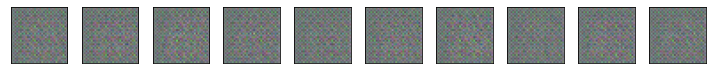

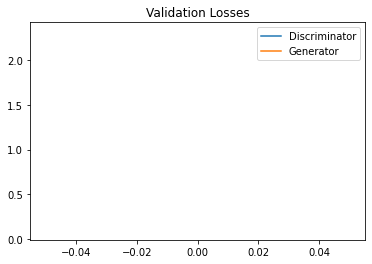

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 35.77it/s]


Epoch:   2/100 Discriminator Loss: 900.3436 Generator Loss: 0.8343


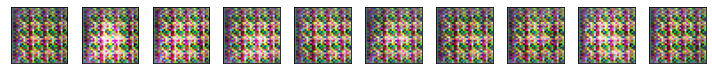

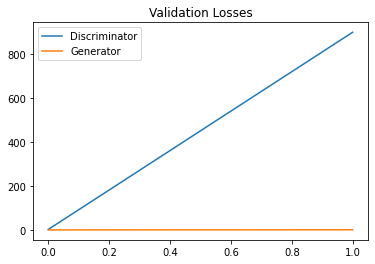

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 35.66it/s]


Epoch:   3/100 Discriminator Loss: 2.0414 Generator Loss: 0.7115


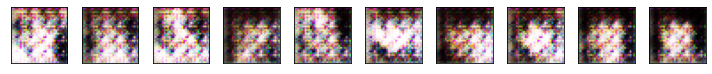

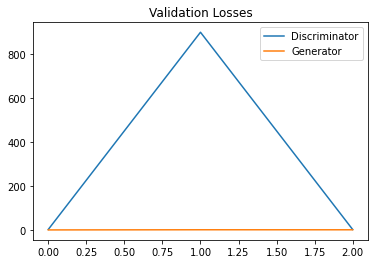

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 35.33it/s]


Epoch:   4/100 Discriminator Loss: 0.2774 Generator Loss: 1.4633


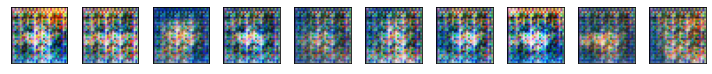

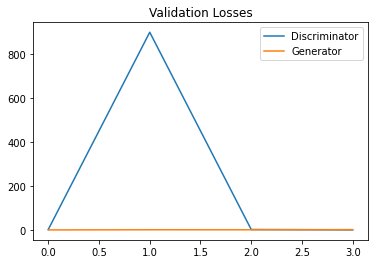

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 35.24it/s]


Epoch:   5/100 Discriminator Loss: 260.3979 Generator Loss: 0.5126


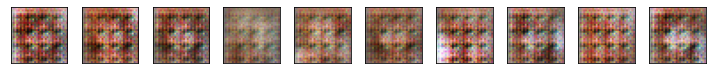

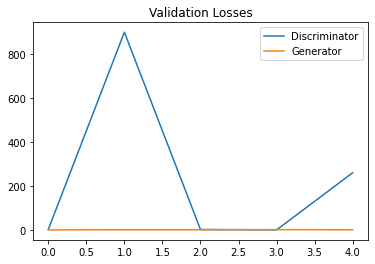

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.74it/s]


Epoch:   6/100 Discriminator Loss: 25.1130 Generator Loss: 0.2368


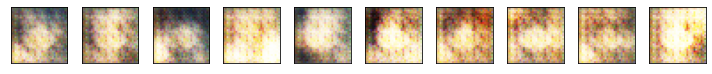

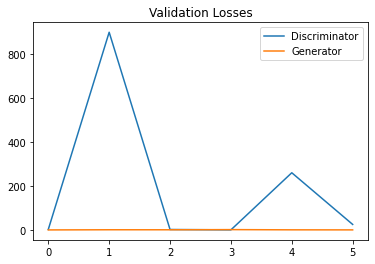

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.55it/s]


Epoch:   7/100 Discriminator Loss: 0.1233 Generator Loss: 3.3201


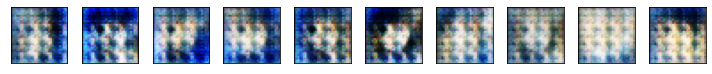

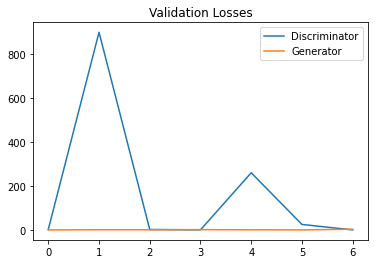

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.28it/s]


Epoch:   8/100 Discriminator Loss: 1.0547 Generator Loss: 0.4974


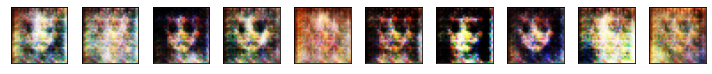

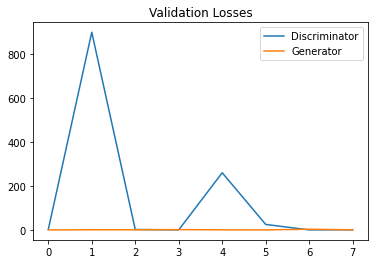

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.28it/s]


Epoch:   9/100 Discriminator Loss: 0.2503 Generator Loss: 1.7004


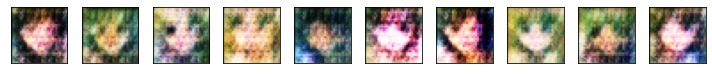

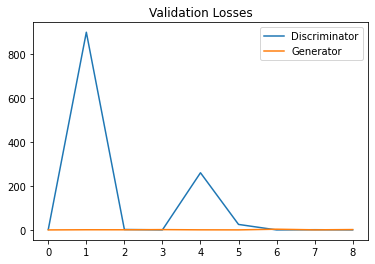

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.85it/s]


Epoch:  10/100 Discriminator Loss: 84.6063 Generator Loss: 1.7506


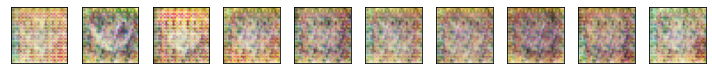

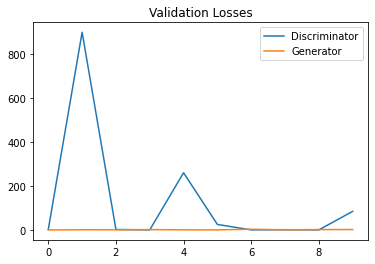

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.96it/s]


Epoch:  11/100 Discriminator Loss: 3.7258 Generator Loss: 1.6503


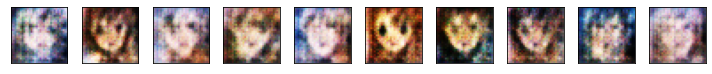

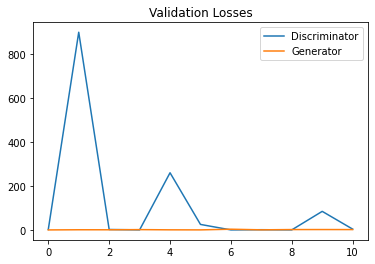

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.46it/s]


Epoch:  12/100 Discriminator Loss: 0.7224 Generator Loss: 0.8565


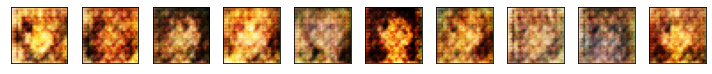

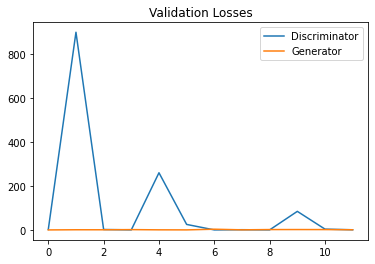

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.34it/s]


Epoch:  13/100 Discriminator Loss: 0.6299 Generator Loss: 1.0142


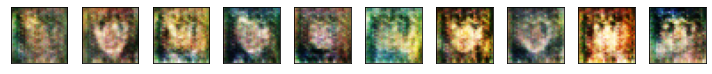

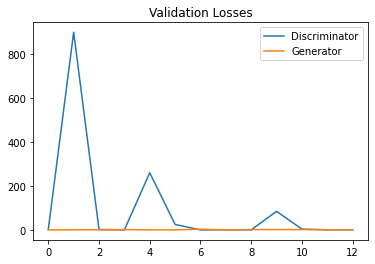

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.38it/s]


Epoch:  14/100 Discriminator Loss: 1.1936 Generator Loss: 0.4934


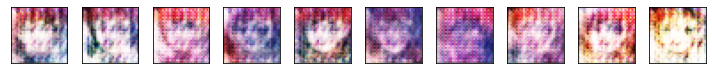

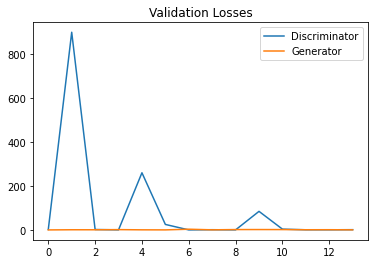

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.04it/s]


Epoch:  15/100 Discriminator Loss: 0.7492 Generator Loss: 0.6775


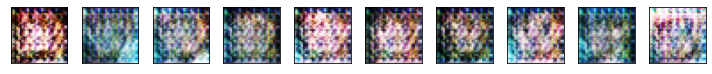

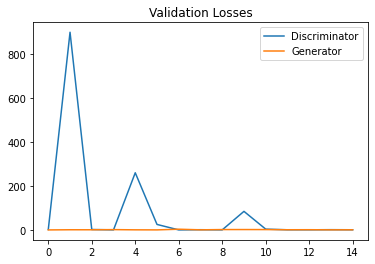

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.26it/s]


Epoch:  16/100 Discriminator Loss: 0.7577 Generator Loss: 0.7074


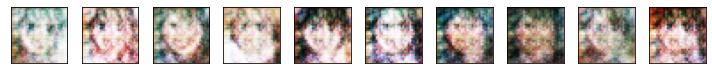

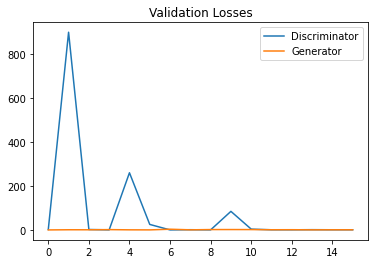

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.67it/s]


Epoch:  17/100 Discriminator Loss: 0.8148 Generator Loss: 0.8080


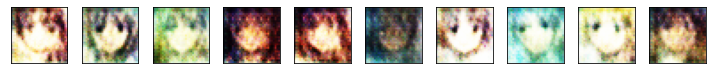

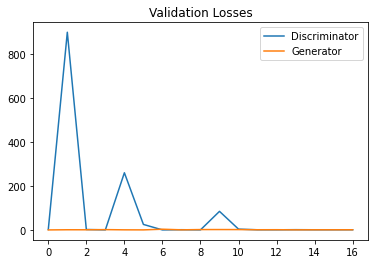

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.81it/s]


Epoch:  18/100 Discriminator Loss: 182.8598 Generator Loss: 0.6586


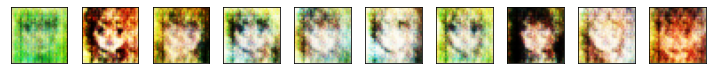

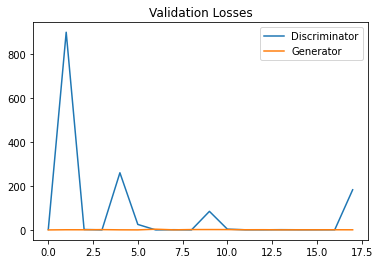

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.54it/s]


Epoch:  19/100 Discriminator Loss: 6.5698 Generator Loss: 0.4732


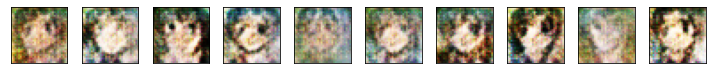

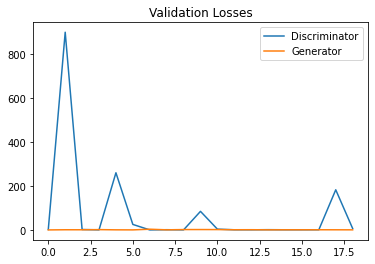

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.23it/s]


Epoch:  20/100 Discriminator Loss: 29.9843 Generator Loss: 0.7996


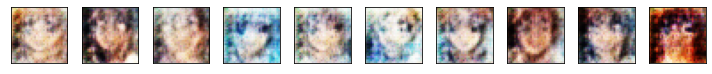

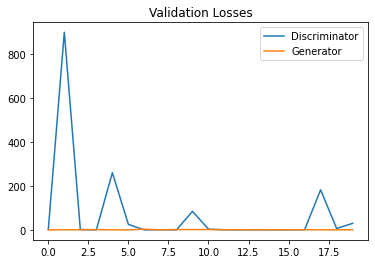

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.36it/s]


Epoch:  21/100 Discriminator Loss: 1.4318 Generator Loss: 0.3455


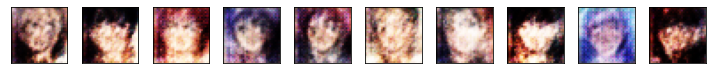

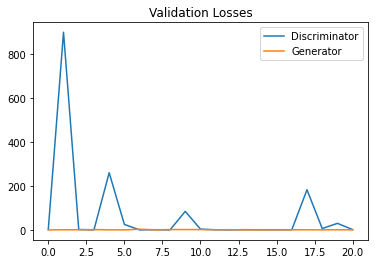

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.24it/s]


Epoch:  22/100 Discriminator Loss: 0.3466 Generator Loss: 1.3604


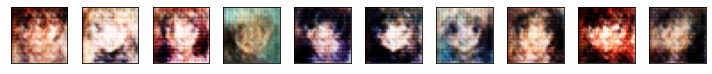

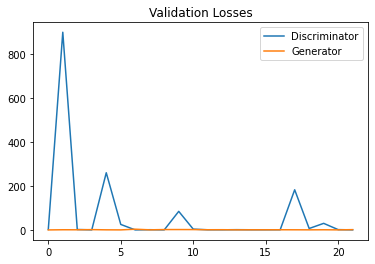

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.78it/s]


Epoch:  23/100 Discriminator Loss: 1.1381 Generator Loss: 0.4295


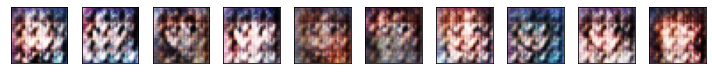

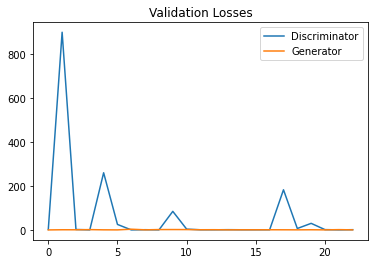

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.29it/s]


Epoch:  24/100 Discriminator Loss: 0.5857 Generator Loss: 0.9138


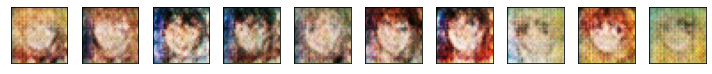

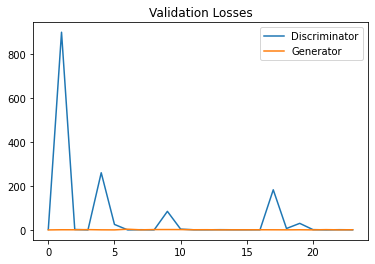

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.34it/s]


Epoch:  25/100 Discriminator Loss: 1.6750 Generator Loss: 0.2799


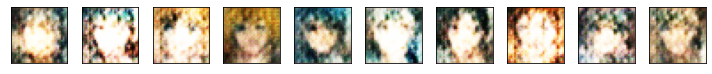

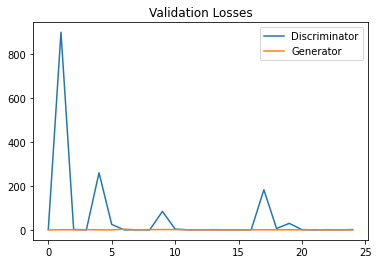

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.09it/s]


Epoch:  26/100 Discriminator Loss: 244.8319 Generator Loss: 0.5032


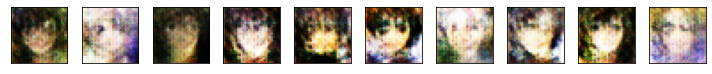

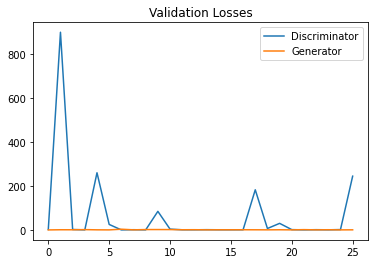

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.28it/s]


Epoch:  27/100 Discriminator Loss: 0.4314 Generator Loss: 1.2075


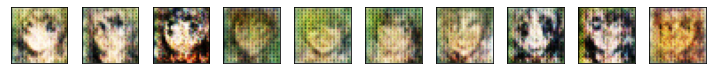

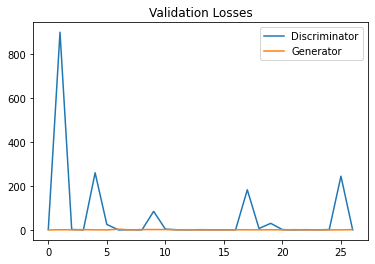

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.29it/s]


Epoch:  28/100 Discriminator Loss: 388.2483 Generator Loss: 1.2765


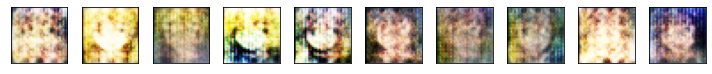

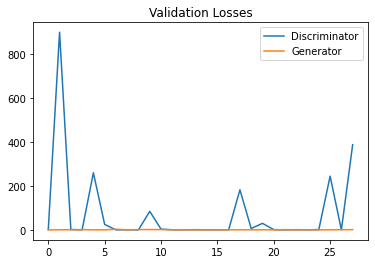

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.43it/s]


Epoch:  29/100 Discriminator Loss: 1.2831 Generator Loss: 0.5049


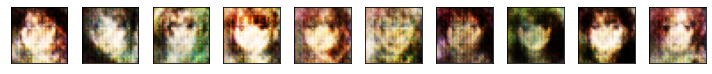

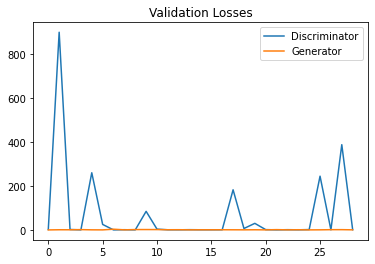

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.34it/s]


Epoch:  30/100 Discriminator Loss: 458.7359 Generator Loss: 0.9864


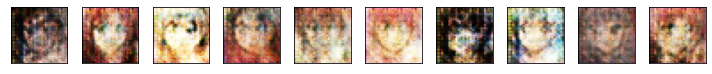

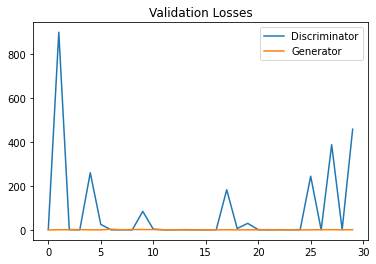

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.08it/s]


Epoch:  31/100 Discriminator Loss: 0.5840 Generator Loss: 0.8926


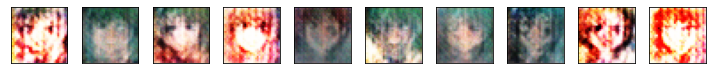

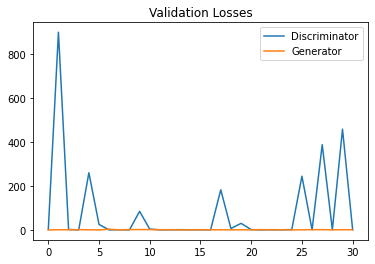

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.13it/s]


Epoch:  32/100 Discriminator Loss: 1.0552 Generator Loss: 0.5161


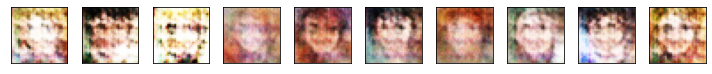

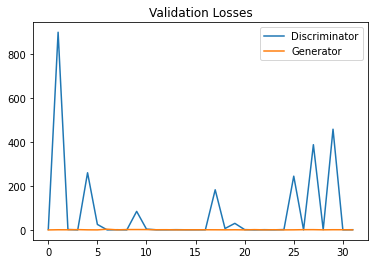

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.97it/s]


Epoch:  33/100 Discriminator Loss: 23.6288 Generator Loss: 0.5147


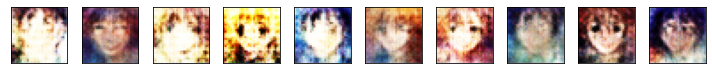

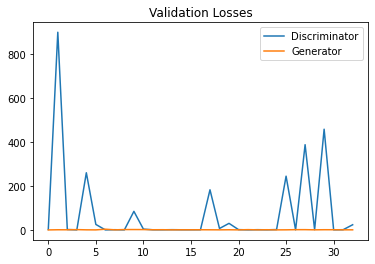

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.91it/s]


Epoch:  34/100 Discriminator Loss: 1.4240 Generator Loss: 0.4554


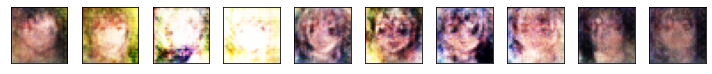

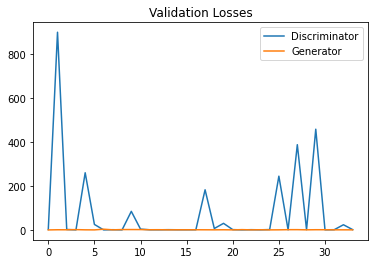

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.99it/s]


Epoch:  35/100 Discriminator Loss: 28.7834 Generator Loss: 0.4754


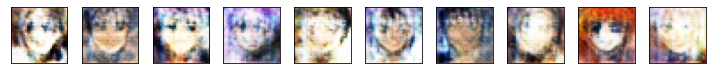

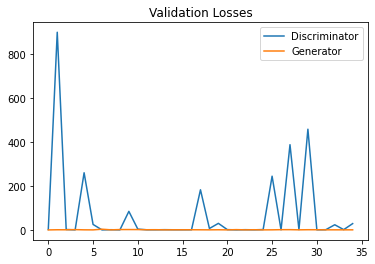

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.61it/s]


Epoch:  36/100 Discriminator Loss: 340.0357 Generator Loss: 0.9647


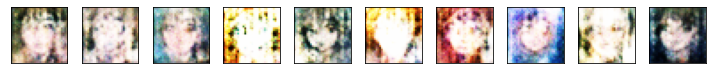

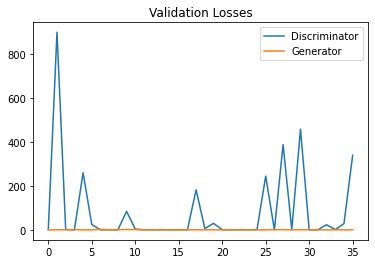

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.83it/s]


Epoch:  37/100 Discriminator Loss: 83.0196 Generator Loss: 0.7892


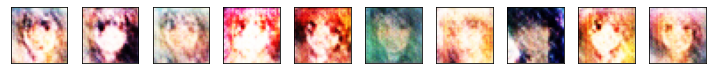

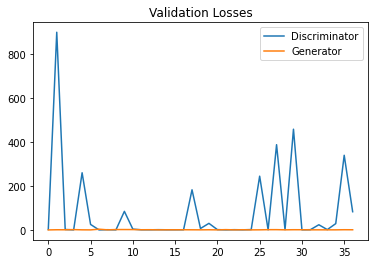

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.55it/s]


Epoch:  38/100 Discriminator Loss: 65.3281 Generator Loss: 0.3853


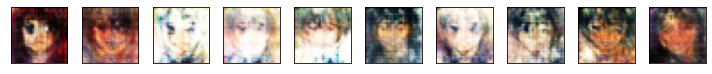

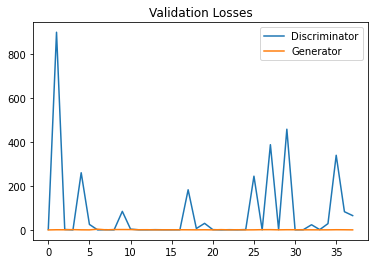

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.63it/s]


Epoch:  39/100 Discriminator Loss: 294.6353 Generator Loss: 0.4712


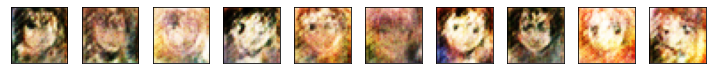

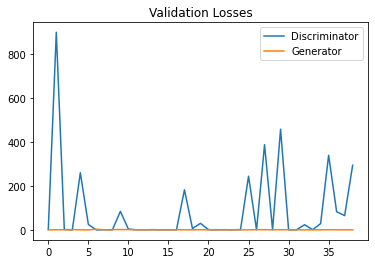

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.66it/s]


Epoch:  40/100 Discriminator Loss: 89.5844 Generator Loss: 1.9313


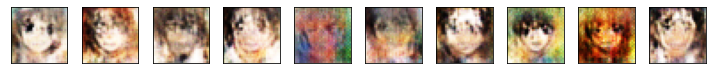

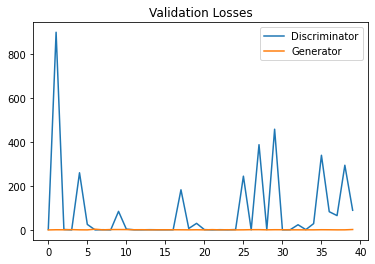

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.52it/s]


Epoch:  41/100 Discriminator Loss: 131.4525 Generator Loss: 1.3914


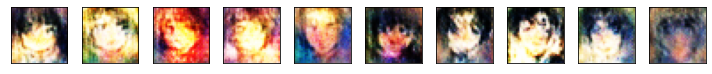

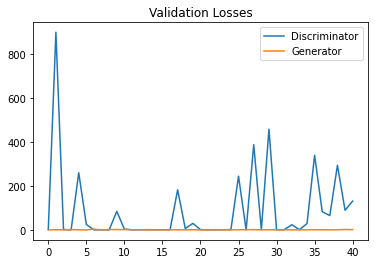

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.23it/s]


Epoch:  42/100 Discriminator Loss: 38.4069 Generator Loss: 0.8711


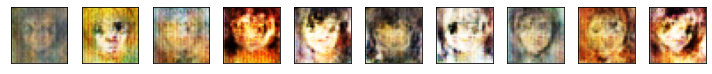

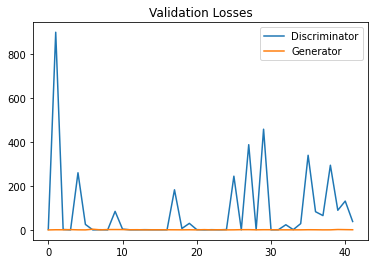

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.17it/s]


Epoch:  43/100 Discriminator Loss: 57.3784 Generator Loss: 0.9622


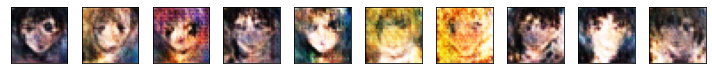

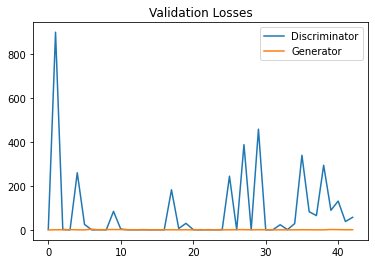

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.32it/s]


Epoch:  44/100 Discriminator Loss: 50.8816 Generator Loss: 0.5090


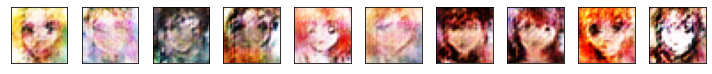

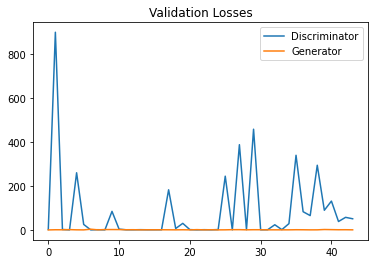

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.19it/s]


Epoch:  45/100 Discriminator Loss: 13.4998 Generator Loss: 0.8243


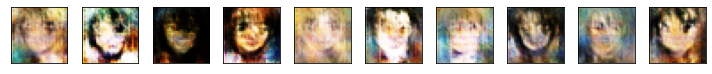

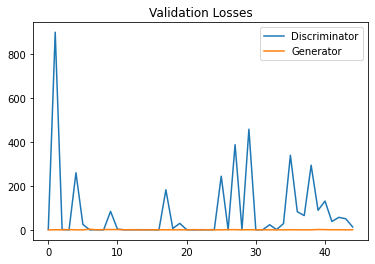

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.06it/s]


Epoch:  46/100 Discriminator Loss: 344.7397 Generator Loss: 1.1874


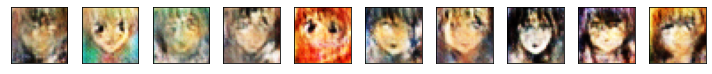

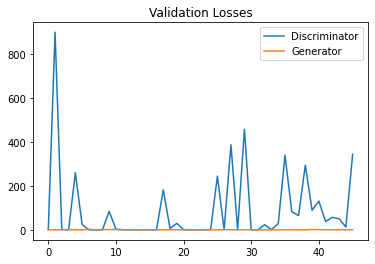

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.41it/s]


Epoch:  47/100 Discriminator Loss: 378.4285 Generator Loss: 1.3040


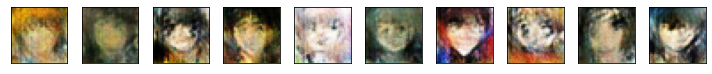

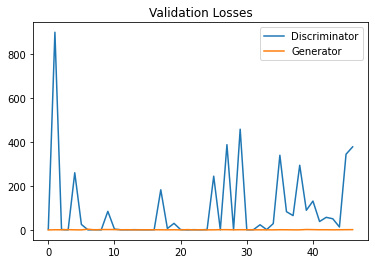

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.22it/s]


Epoch:  48/100 Discriminator Loss: 228.1904 Generator Loss: 1.2402


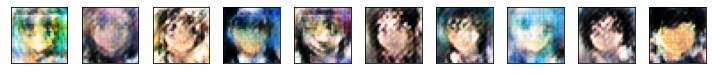

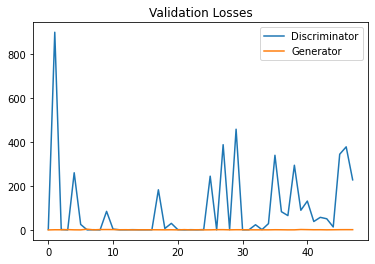

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.21it/s]


Epoch:  49/100 Discriminator Loss: 144.9995 Generator Loss: 0.4578


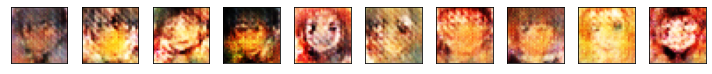

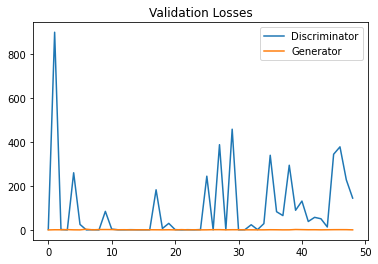

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.02it/s]


Epoch:  50/100 Discriminator Loss: 171.4488 Generator Loss: 0.9200


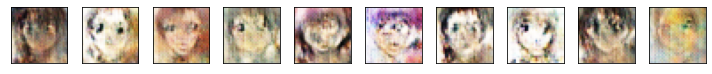

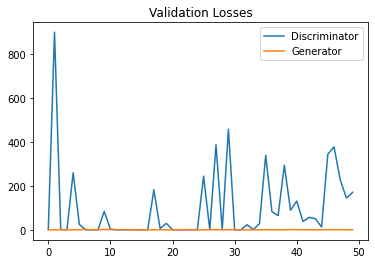

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.18it/s]


Epoch:  51/100 Discriminator Loss: 386.6141 Generator Loss: 1.9179


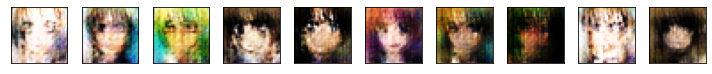

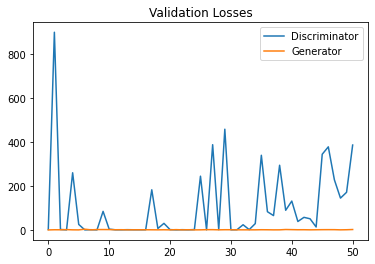

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 30.89it/s]


Epoch:  52/100 Discriminator Loss: 278.5226 Generator Loss: 0.6668


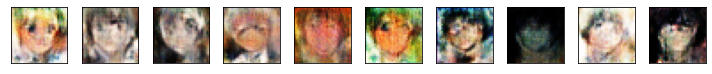

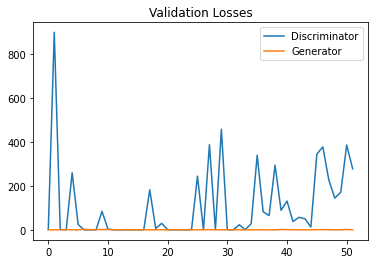

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.07it/s]


Epoch:  53/100 Discriminator Loss: 70.3125 Generator Loss: 0.7688


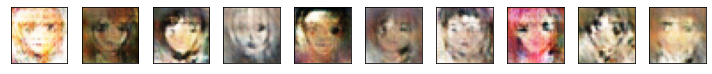

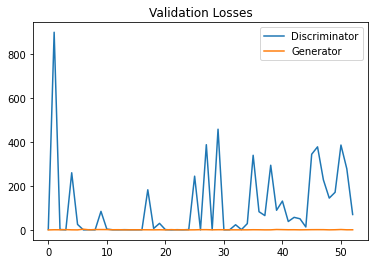

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.01it/s]


Epoch:  54/100 Discriminator Loss: 347.5354 Generator Loss: 1.5242


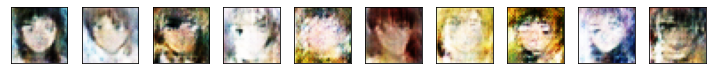

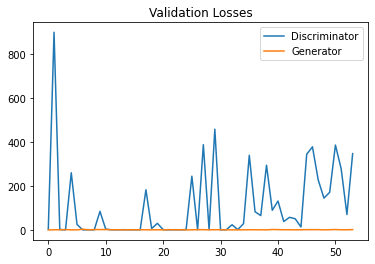

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.67it/s]


Epoch:  55/100 Discriminator Loss: 194.1169 Generator Loss: 1.7887


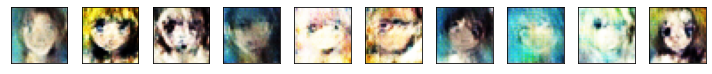

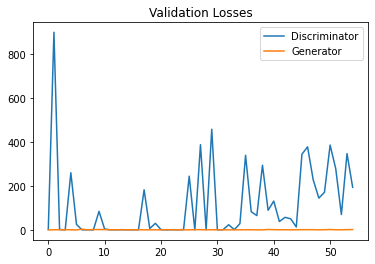

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 30.92it/s]


Epoch:  56/100 Discriminator Loss: 141.6581 Generator Loss: 1.8660


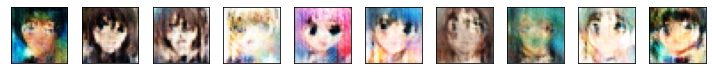

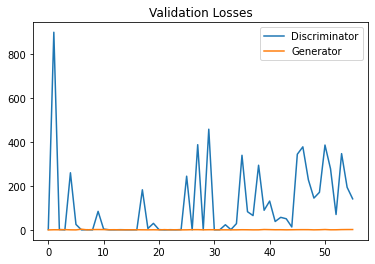

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.69it/s]


Epoch:  57/100 Discriminator Loss: 282.1586 Generator Loss: 1.5103


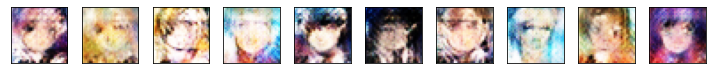

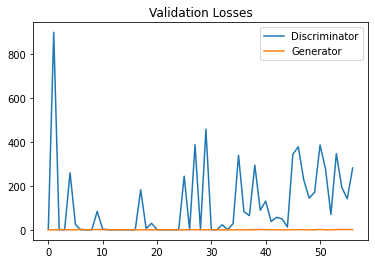

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.75it/s]


Epoch:  58/100 Discriminator Loss: 0.1099 Generator Loss: 2.6803


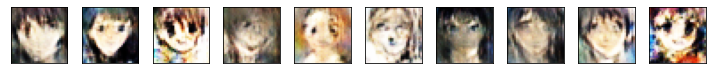

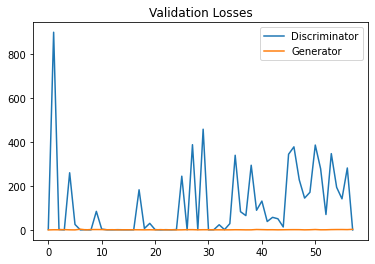

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.84it/s]


Epoch:  59/100 Discriminator Loss: 0.1954 Generator Loss: 2.1183


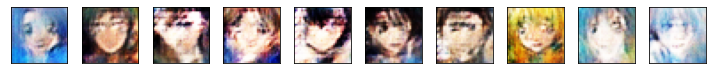

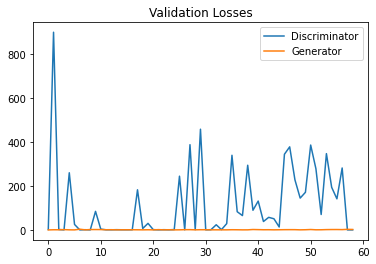

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.64it/s]


Epoch:  60/100 Discriminator Loss: 324.7466 Generator Loss: 2.4471


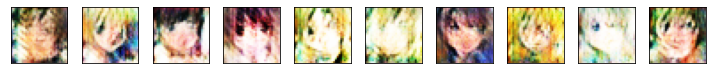

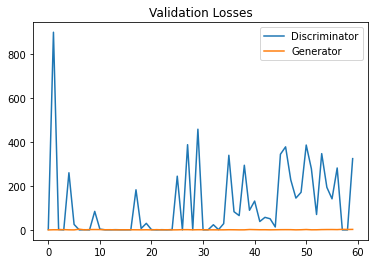

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.67it/s]


Epoch:  61/100 Discriminator Loss: 289.8681 Generator Loss: 1.6765


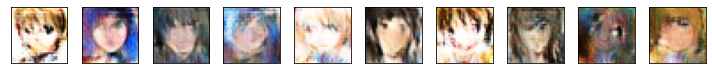

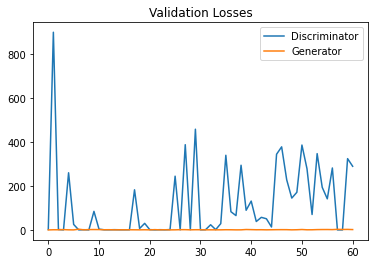

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.56it/s]


Epoch:  62/100 Discriminator Loss: 151.3365 Generator Loss: 2.5656


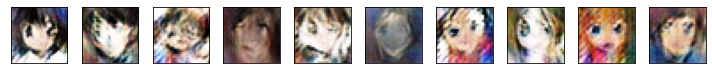

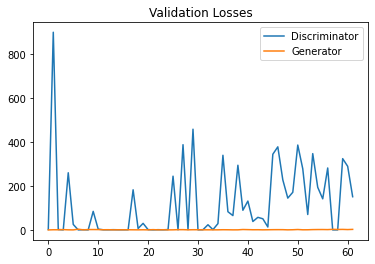

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.63it/s]


Epoch:  63/100 Discriminator Loss: 2.7684 Generator Loss: 1.8600


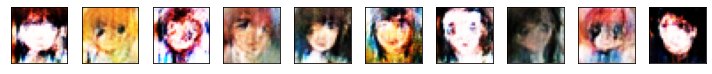

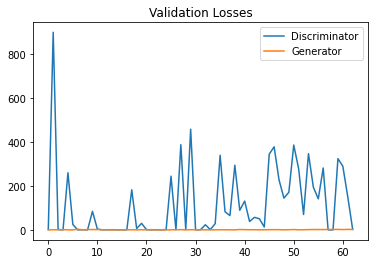

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.39it/s]


Epoch:  64/100 Discriminator Loss: 155.4495 Generator Loss: 2.2662


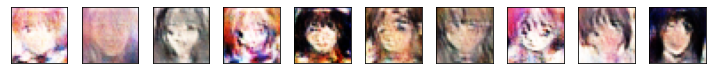

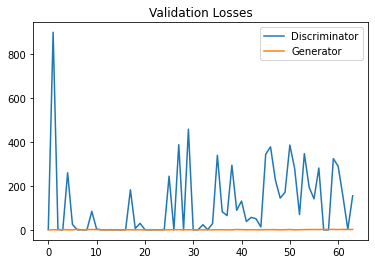

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.38it/s]


Epoch:  65/100 Discriminator Loss: 51.8361 Generator Loss: 1.6493


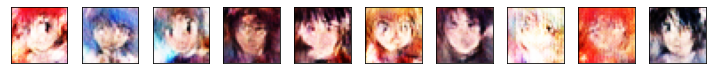

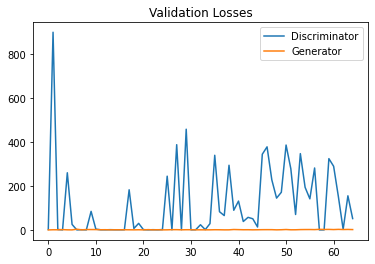

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.87it/s]


Epoch:  66/100 Discriminator Loss: 0.3595 Generator Loss: 1.7062


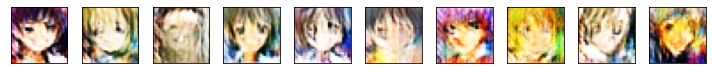

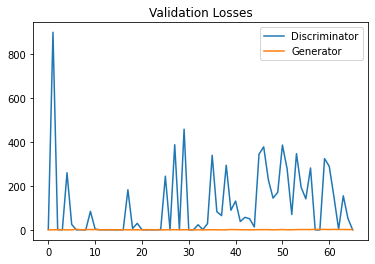

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.23it/s]


Epoch:  67/100 Discriminator Loss: 53.8631 Generator Loss: 1.9062


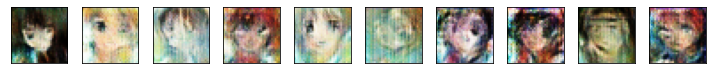

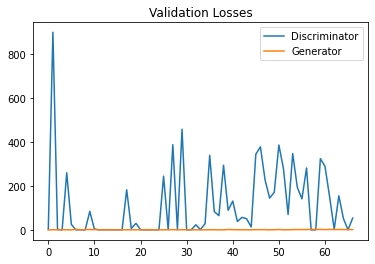

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.12it/s]


Epoch:  68/100 Discriminator Loss: 0.5764 Generator Loss: 0.9822


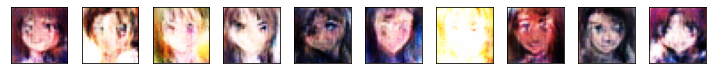

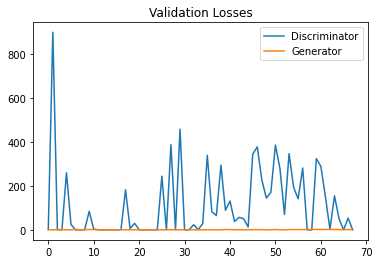

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.47it/s]


Epoch:  69/100 Discriminator Loss: 15.3719 Generator Loss: 0.6528


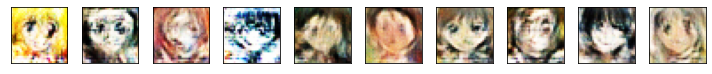

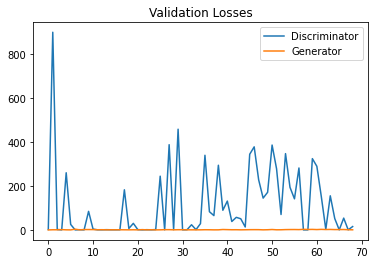

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.61it/s]


Epoch:  70/100 Discriminator Loss: 369.0127 Generator Loss: 1.1548


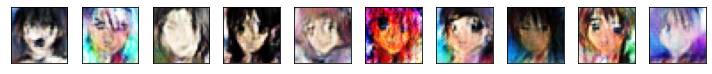

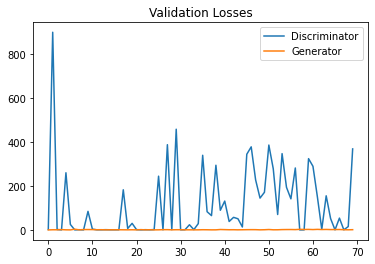

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.91it/s]


Epoch:  71/100 Discriminator Loss: 43.4730 Generator Loss: 1.9374


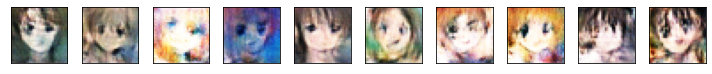

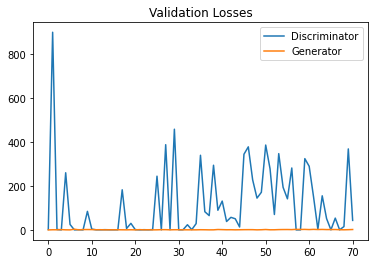

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.65it/s]


Epoch:  72/100 Discriminator Loss: 17.9145 Generator Loss: 1.5942


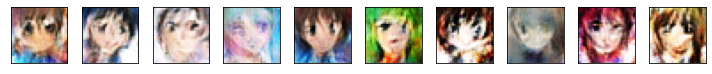

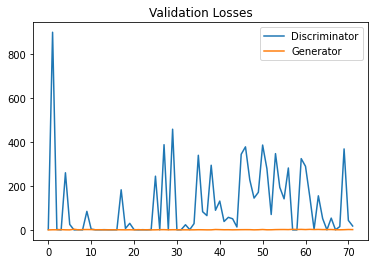

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.21it/s]


Epoch:  73/100 Discriminator Loss: 55.7574 Generator Loss: 1.5920


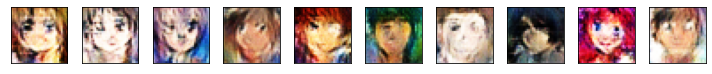

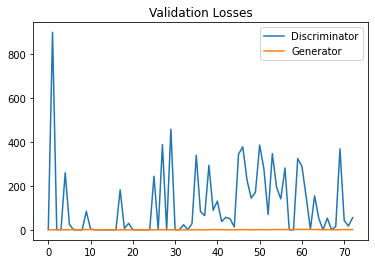

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.09it/s]


Epoch:  74/100 Discriminator Loss: 43.4823 Generator Loss: 2.5023


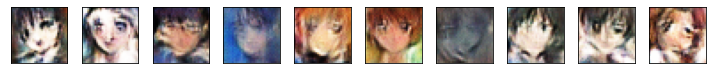

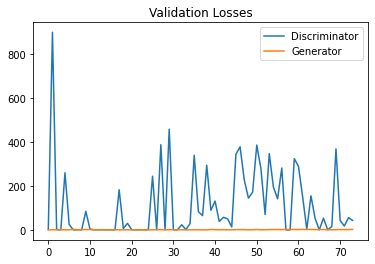

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.81it/s]


Epoch:  75/100 Discriminator Loss: 121.3817 Generator Loss: 1.9218


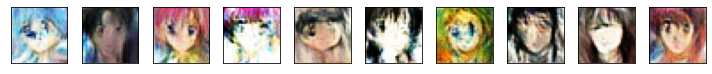

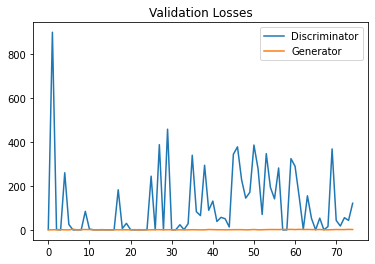

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.27it/s]


Epoch:  76/100 Discriminator Loss: 69.4701 Generator Loss: 1.9926


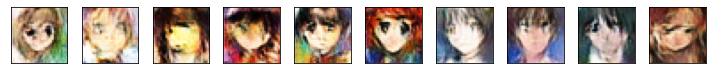

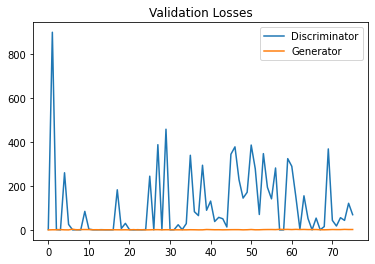

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.57it/s]


Epoch:  77/100 Discriminator Loss: 0.1940 Generator Loss: 2.2621


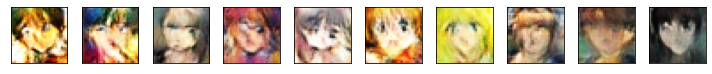

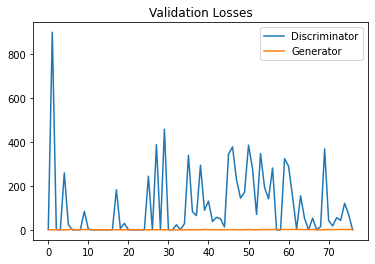

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.91it/s]


Epoch:  78/100 Discriminator Loss: 2.0318 Generator Loss: 2.6761


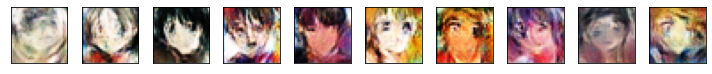

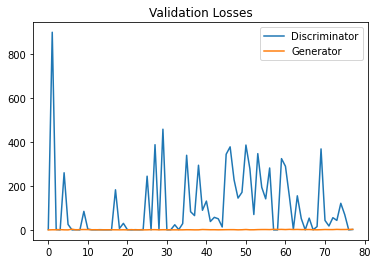

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.55it/s]


Epoch:  79/100 Discriminator Loss: 31.2147 Generator Loss: 1.7596


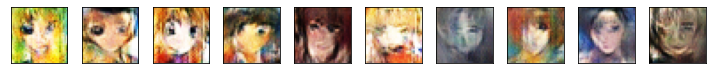

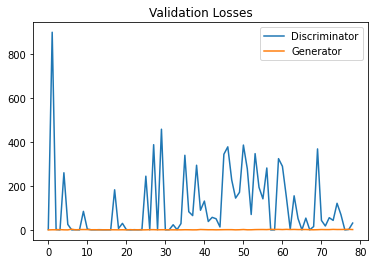

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.48it/s]


Epoch:  80/100 Discriminator Loss: 0.3169 Generator Loss: 2.4251


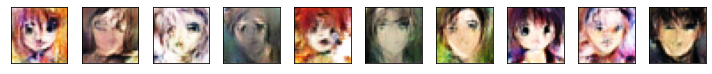

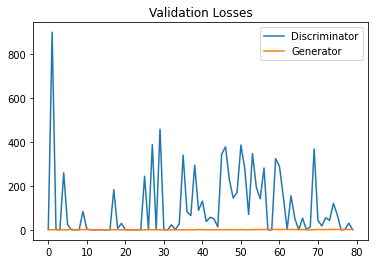

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.54it/s]


Epoch:  81/100 Discriminator Loss: 0.1573 Generator Loss: 2.1377


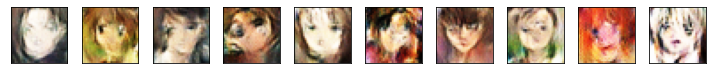

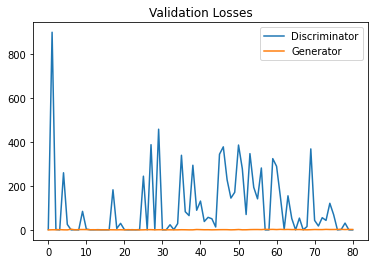

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.29it/s]


Epoch:  82/100 Discriminator Loss: 131.3614 Generator Loss: 2.6771


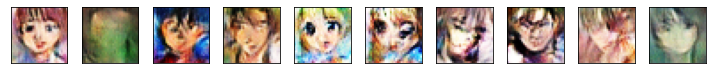

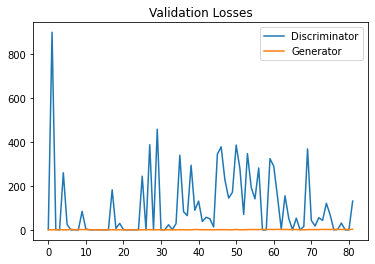

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.53it/s]


Epoch:  83/100 Discriminator Loss: 0.1482 Generator Loss: 2.5631


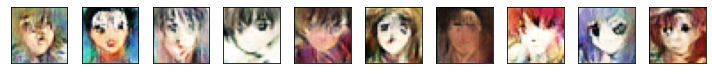

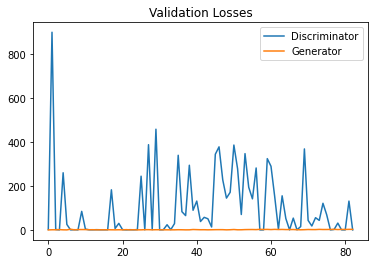

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.51it/s]


Epoch:  84/100 Discriminator Loss: 0.1605 Generator Loss: 2.0597


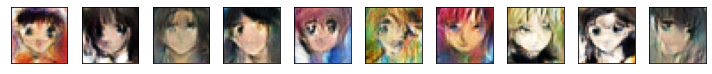

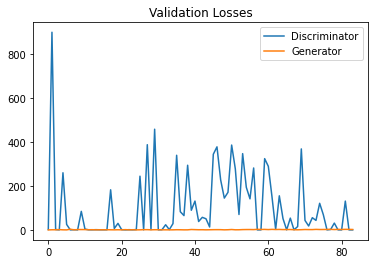

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.52it/s]


Epoch:  85/100 Discriminator Loss: 116.2329 Generator Loss: 2.0243


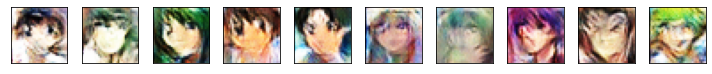

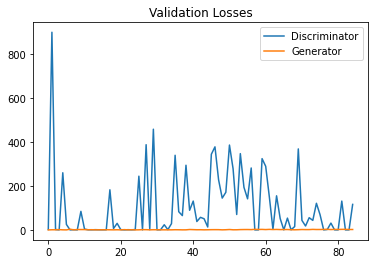

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.66it/s]


Epoch:  86/100 Discriminator Loss: 37.5590 Generator Loss: 2.0860


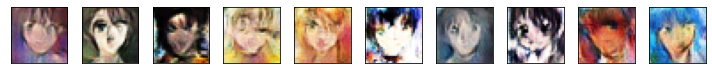

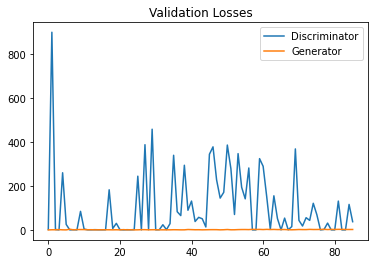

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.12it/s]


Epoch:  87/100 Discriminator Loss: 45.4480 Generator Loss: 2.1568


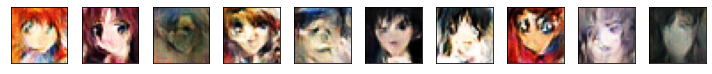

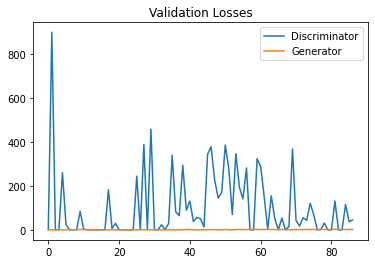

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.44it/s]


Epoch:  88/100 Discriminator Loss: 149.6797 Generator Loss: 2.2522


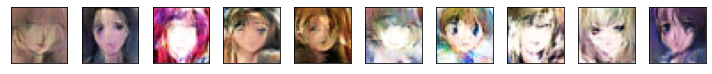

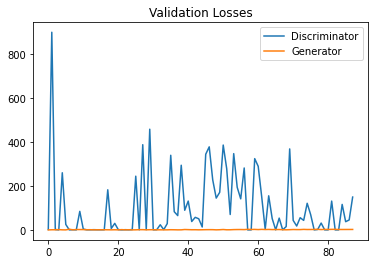

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.42it/s]


Epoch:  89/100 Discriminator Loss: 1.7545 Generator Loss: 2.4045


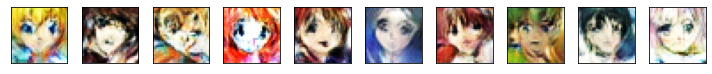

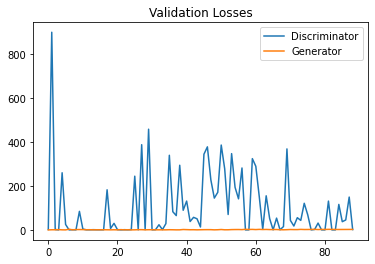

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.34it/s]


Epoch:  90/100 Discriminator Loss: 10.6375 Generator Loss: 2.0711


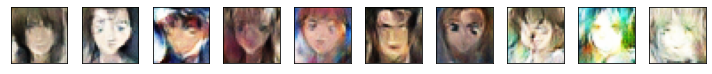

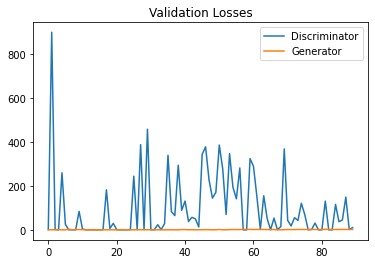

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.55it/s]


Epoch:  91/100 Discriminator Loss: 152.7318 Generator Loss: 1.7580


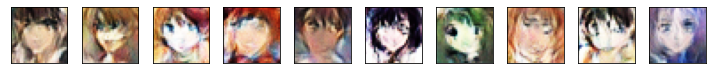

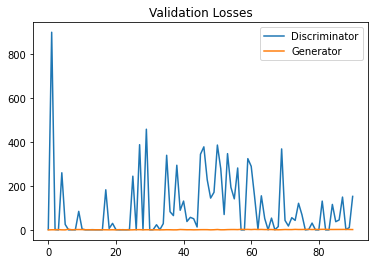

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.25it/s]


Epoch:  92/100 Discriminator Loss: 268.5332 Generator Loss: 2.8353


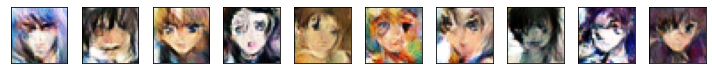

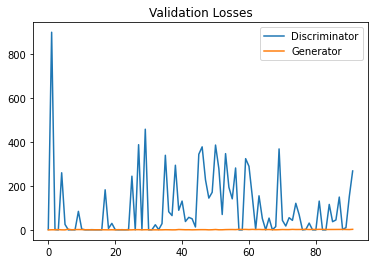

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.35it/s]


Epoch:  93/100 Discriminator Loss: 105.2386 Generator Loss: 1.8544


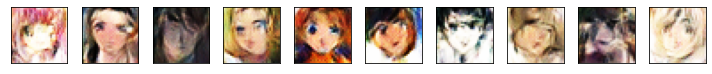

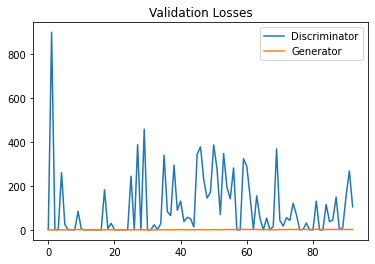

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.25it/s]


Epoch:  94/100 Discriminator Loss: 108.2701 Generator Loss: 1.5714


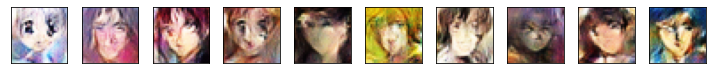

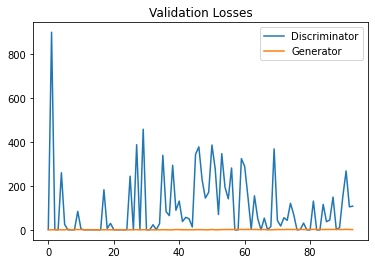

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.44it/s]


Epoch:  95/100 Discriminator Loss: 132.0160 Generator Loss: 2.3740


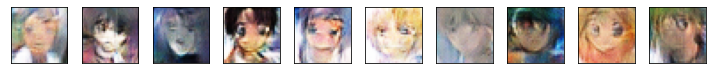

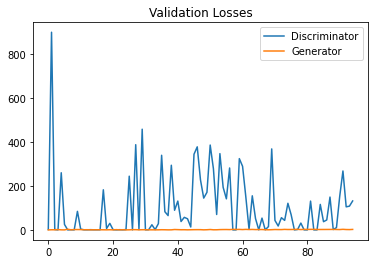

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.26it/s]


Epoch:  96/100 Discriminator Loss: 0.2630 Generator Loss: 1.9678


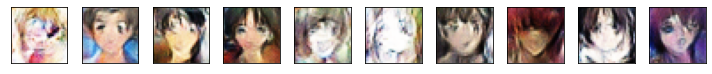

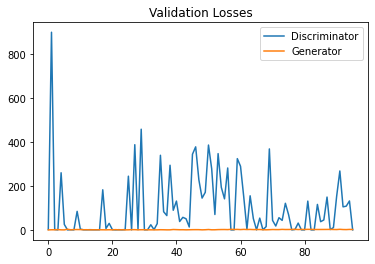

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.40it/s]


Epoch:  97/100 Discriminator Loss: 157.2321 Generator Loss: 2.1084


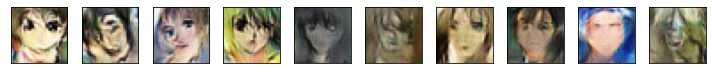

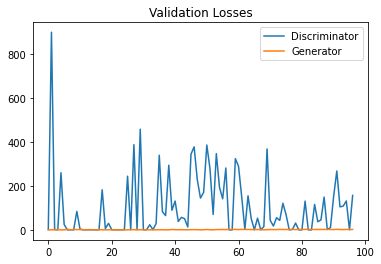

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.45it/s]


Epoch:  98/100 Discriminator Loss: 45.4600 Generator Loss: 2.3713


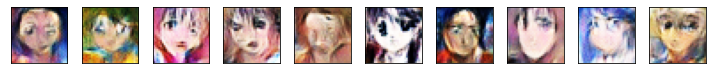

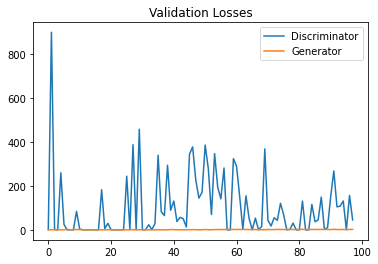

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.36it/s]


Epoch:  99/100 Discriminator Loss: 64.2549 Generator Loss: 2.8771


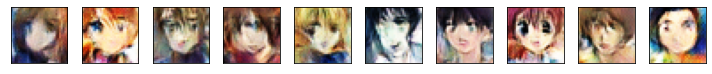

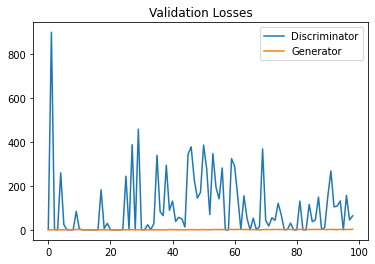

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.57it/s]


Epoch: 100/100 Discriminator Loss: 33.6142 Generator Loss: 2.0153


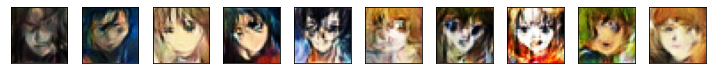

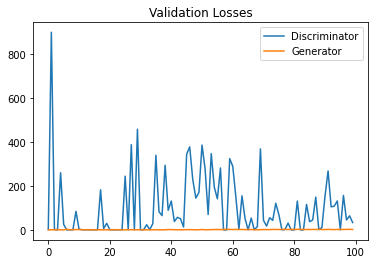

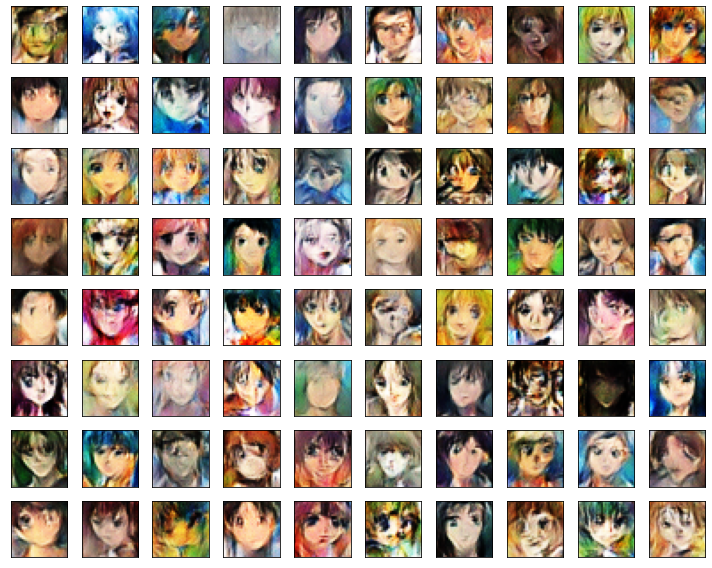

In [ ]:
for e in range(epochs):
    for i in tqdm(range(len(X_train)//batch_size)):
        # real CelebA images
        X_batch_real = X_train_norm[i*batch_size:(i+1)*batch_size]
         # latent samples and the generated digit images
        latent_samples = make_latent_samples(batch_size, sample_size)
        X_batch_fake = generator.predict_on_batch(latent_samples)
        
        # train the discriminator to detect real and fake images
        make_trainable(discriminator, True)        
        discriminator.train_on_batch(X_batch_real, y_train_real * (1 - smooth))
        discriminator.train_on_batch(X_batch_fake, y_train_fake)
        
        # train the generator via GAN
        make_trainable(discriminator, False)
        gan.train_on_batch(latent_samples, y_train_real)
    
    # evaluate
    X_eval_real = X_test_norm[np.random.choice(len(X_test), eval_size, replace=False)]    
    latent_samples = make_latent_samples(eval_size, sample_size)
    X_eval_fake = generator.predict_on_batch(latent_samples)
    
    d_loss  = discriminator.test_on_batch(X_eval_real, y_eval_real)
    d_loss += discriminator.test_on_batch(X_eval_fake, y_eval_fake)
    g_loss  = gan.test_on_batch(latent_samples, y_eval_real) # we want the fake to be realistic!
    
    losses.append((d_loss, g_loss))
    
    print("Epoch: {:>3}/{} Discriminator Loss: {:>6.4f} Generator Loss: {:>6.4f}".format(
        e+1, epochs, d_loss, g_loss))    
    show_images(X_eval_fake[:10])
    show_losses(losses)
    
# show the result
if show_details:
#    show_losses(losses)
    show_images(generator.predict(make_latent_samples(80, sample_size)))

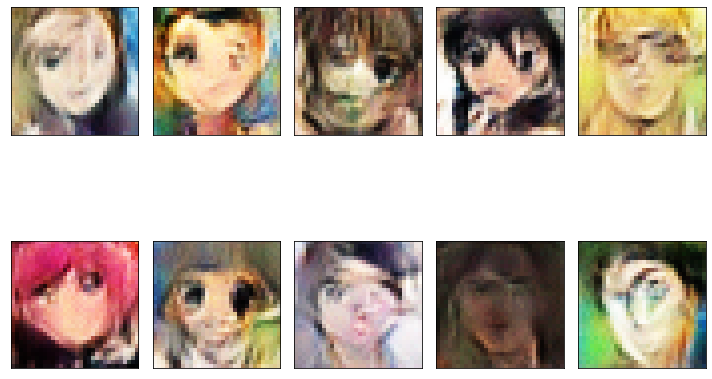

In [ ]:
show_images(generator.predict(make_latent_samples(10, sample_size)), cols=5)

## **References**

<a id="ref1"></a>
### [1] Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks

Alec Radford & Luke Metz (indico Research), Soumith Chintala (Facebook AI Research)

https://arxiv.org/pdf/1511.06434.pdf

<a id="ref2"></a>
### [2] Face Generation Project (Deep Learning Foundactions)
Udacity

https://github.com/udacity/deep-learning/blob/master/face_generation/dlnd_face_generation.ipynb
